# Description:
- "In this project, we classify images into six categories (buildings, forest, glacier, mountain, sea, and street) using a Convolutional Neural Network (CNN). The model is trained on the Intel Image Classification dataset. We utilize Python libraries such as Keras and TensorFlow to design and implement the model, achieving significant accuracy in image classification."

# Sections:
- Data Preparation: Loading and preprocessing the dataset.
- Model Building: Constructing a multi-layer CNN model.
- Evaluation: Assessing model performance and visualizing results.

# 1.Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style="whitegrid")
import os
import glob as gb
import cv2
import tensorflow as tf
import keras
import warnings
warnings.filterwarnings("ignore")

# 2. Setting Data Paths

In [2]:
train_path = 'G:\INTEL\seg_train'
test_path = 'G:\INTEL\seg_test'
pred_path = 'G:\INTEL\seg_pred'

# 3. Data Inspection

- Counting Images

In [3]:
for folder in os.listdir(os.path.join(train_path, 'seg_train')):
    folder_path = os.path.join(train_path, 'seg_train', folder)
    files = gb.glob(os.path.join(folder_path, '*.jpg'))
    print(f'For training data, found {len(files)} files in folder "{folder}"')

For training data, found 2191 files in folder "buildings"
For training data, found 2271 files in folder "forest"
For training data, found 2404 files in folder "glacier"
For training data, found 2512 files in folder "mountain"
For training data, found 2274 files in folder "sea"
For training data, found 2382 files in folder "street"


In [4]:
for folder in os.listdir(os.path.join(test_path, 'seg_test')):
    folder_path = os.path.join(test_path, 'seg_test', folder)
    files = gb.glob(os.path.join(folder_path, '*.jpg'))
    print(f'For testdata, found {len(files)} files in folder "{folder}"')

For testdata, found 437 files in folder "buildings"
For testdata, found 474 files in folder "forest"
For testdata, found 553 files in folder "glacier"
For testdata, found 525 files in folder "mountain"
For testdata, found 510 files in folder "sea"
For testdata, found 501 files in folder "street"


In [5]:
files = gb.glob(os.path.join(pred_path, 'seg_pred', '*.jpg'))
print(f'Found {len(files)} files ')


Found 7301 files 


- Checking Image Dimensions

In [6]:
size=[]
for folder in os.listdir(os.path.join(train_path, 'seg_train')):
    folder_path = os.path.join(train_path, 'seg_train', folder)
    files = gb.glob(os.path.join(folder_path, '*.jpg'))
    for file in files:
        image=plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    13986
(113, 150, 3)        7
(111, 150, 3)        3
(135, 150, 3)        3
(144, 150, 3)        2
(123, 150, 3)        2
(142, 150, 3)        2
(146, 150, 3)        2
(143, 150, 3)        2
(134, 150, 3)        2
(136, 150, 3)        2
(108, 150, 3)        2
(105, 150, 3)        1
(97, 150, 3)         1
(131, 150, 3)        1
(147, 150, 3)        1
(81, 150, 3)         1
(145, 150, 3)        1
(141, 150, 3)        1
(100, 150, 3)        1
(103, 150, 3)        1
(76, 150, 3)         1
(120, 150, 3)        1
(102, 150, 3)        1
(119, 150, 3)        1
(133, 150, 3)        1
(115, 150, 3)        1
(124, 150, 3)        1
(110, 150, 3)        1
(149, 150, 3)        1
(140, 150, 3)        1
Name: count, dtype: int64

In [7]:
size=[]
for folder in os.listdir(os.path.join(test_path, 'seg_test')):
    folder_path = os.path.join(test_path, 'seg_test', folder)
    files = gb.glob(os.path.join(folder_path, '*.jpg'))
    for file in files:
        image=plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    2993
(141, 150, 3)       1
(110, 150, 3)       1
(76, 150, 3)        1
(149, 150, 3)       1
(72, 150, 3)        1
(131, 150, 3)       1
(81, 150, 3)        1
Name: count, dtype: int64

In [8]:
size=[]
files = gb.glob(os.path.join(pred_path, 'seg_pred', '*.jpg'))
for file in files:
        image=plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    7288
(133, 150, 3)       1
(139, 150, 3)       1
(108, 150, 3)       1
(124, 150, 3)       1
(131, 150, 3)       1
(144, 150, 3)       1
(149, 150, 3)       1
(143, 150, 3)       1
(129, 150, 3)       1
(100, 150, 3)       1
(112, 150, 3)       1
(126, 150, 3)       1
(374, 500, 3)       1
Name: count, dtype: int64

# 4. Image Preprocessing

- Standardizing Image Size

In [9]:
s=100

- Mapping Labels to Numeric Codes

In [10]:
code={'buildings':0,'forest':1,'glacier':2,'mountain':3,'sea':4,'street':5}
def getcode(n):
    for x,y in code.items():
        if n==y:
            return x

# 5. Preparing the Datasets

- Training Data

In [11]:
x_train=[]
y_train=[]
for folder in os.listdir(os.path.join(train_path, 'seg_train')):
    folder_path = os.path.join(train_path, 'seg_train', folder)
    files = gb.glob(os.path.join(folder_path, '*.jpg'))
    for file in files:
        image=cv2.imread(file)
        image_array=cv2.resize(image,(s,s))
        x_train.append(list(image_array))
        y_train.append(code[folder])



In [12]:
print(f'we have {len(x_train)} items in x_train')

we have 14034 items in x_train


- Testing Data

In [13]:
x_test=[]
y_test=[]
for folder in os.listdir(os.path.join(test_path, 'seg_test')):
    folder_path = os.path.join(test_path, 'seg_test', folder)
    files = gb.glob(os.path.join(folder_path, '*.jpg'))
    for file in files:
        image=cv2.imread(file)
        image_array=cv2.resize(image,(s,s))
        x_test.append(list(image_array))
        y_test.append(code[folder])



In [14]:
print(f'we have {len(x_test)} items in x_test')


we have 3000 items in x_test


In [15]:
x_pred=[]
files=gb.glob(os.path.join(pred_path,'seg_pred','*.jpg'))
for file in files:
    image=cv2.imread(file)
    image_array=cv2.resize(image,(s,s))
    x_pred.append(list(image_array))
    


In [17]:
print(f'we have{len(x_pred)} items in x_pred')

we have7301 items in x_pred


# 6. Visualizing Sample Images

- Training Data Visualization

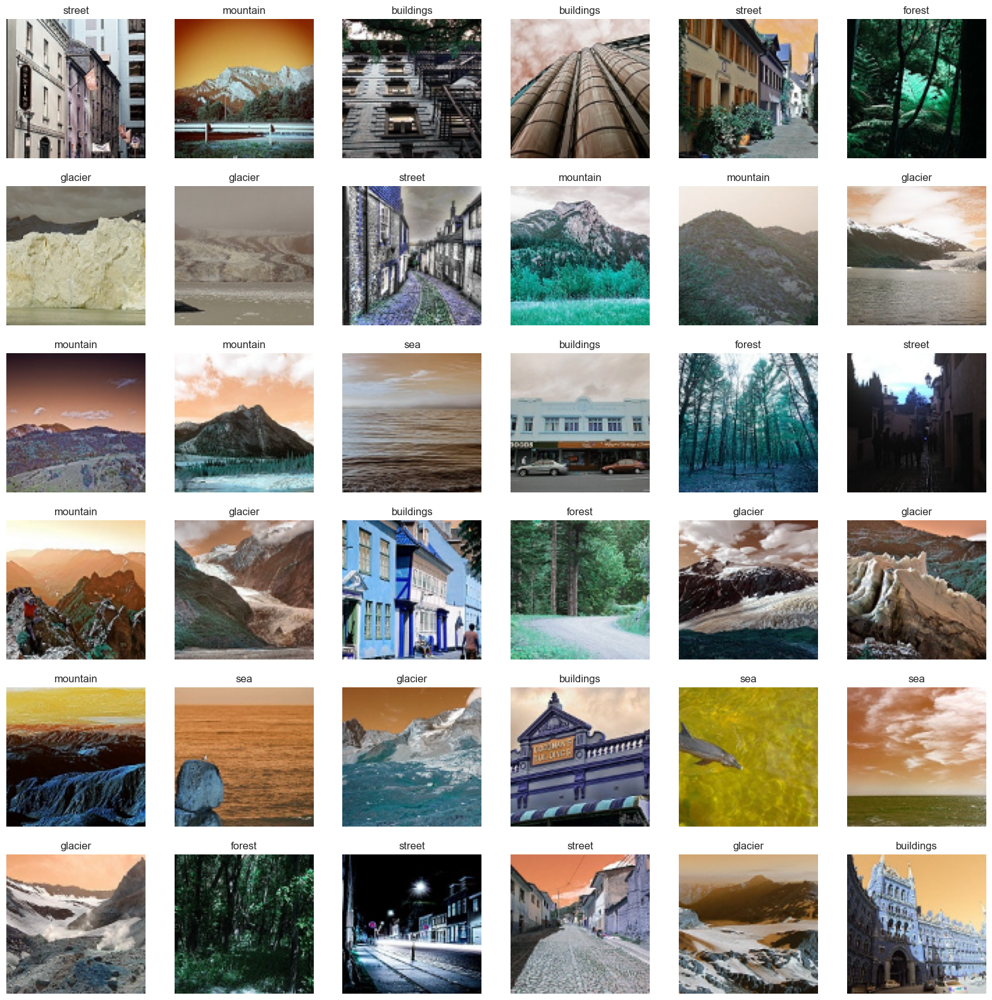

In [18]:
plt.figure(figsize=(20,20))
for n,i in enumerate(list(np.random.randint(0,len(x_train),36))):
    plt.subplot(6,6,n+1)
    plt.imshow(x_train[i])
    plt.axis('off')
    plt.title(getcode(y_train[i]))

- Test Data Visualization



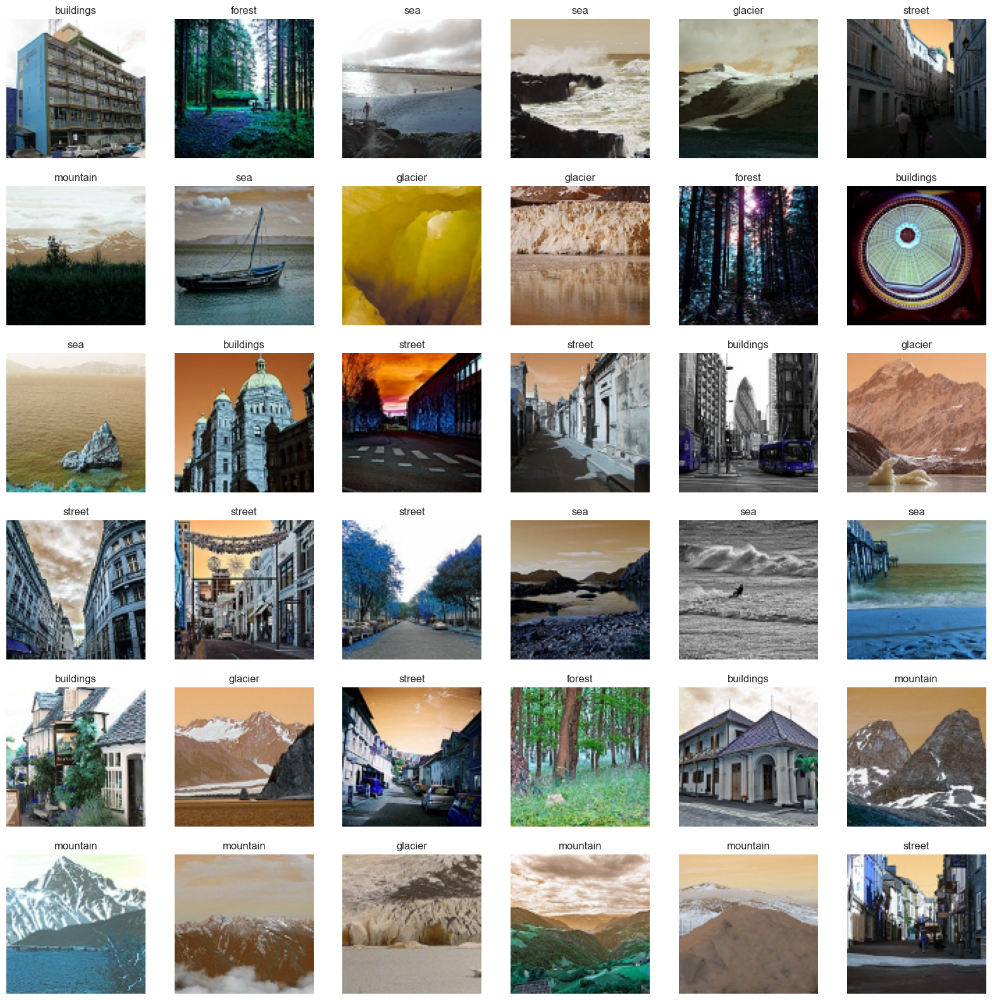

In [19]:
plt.figure(figsize=(20,20))
for n,i in enumerate(list(np.random.randint(0,len(x_test),36))):
    plt.subplot(6,6,n+1)
    plt.imshow(x_test[i])
    plt.axis('off')
    plt.title(getcode(y_test[i]))

- Prediction Data Visualization

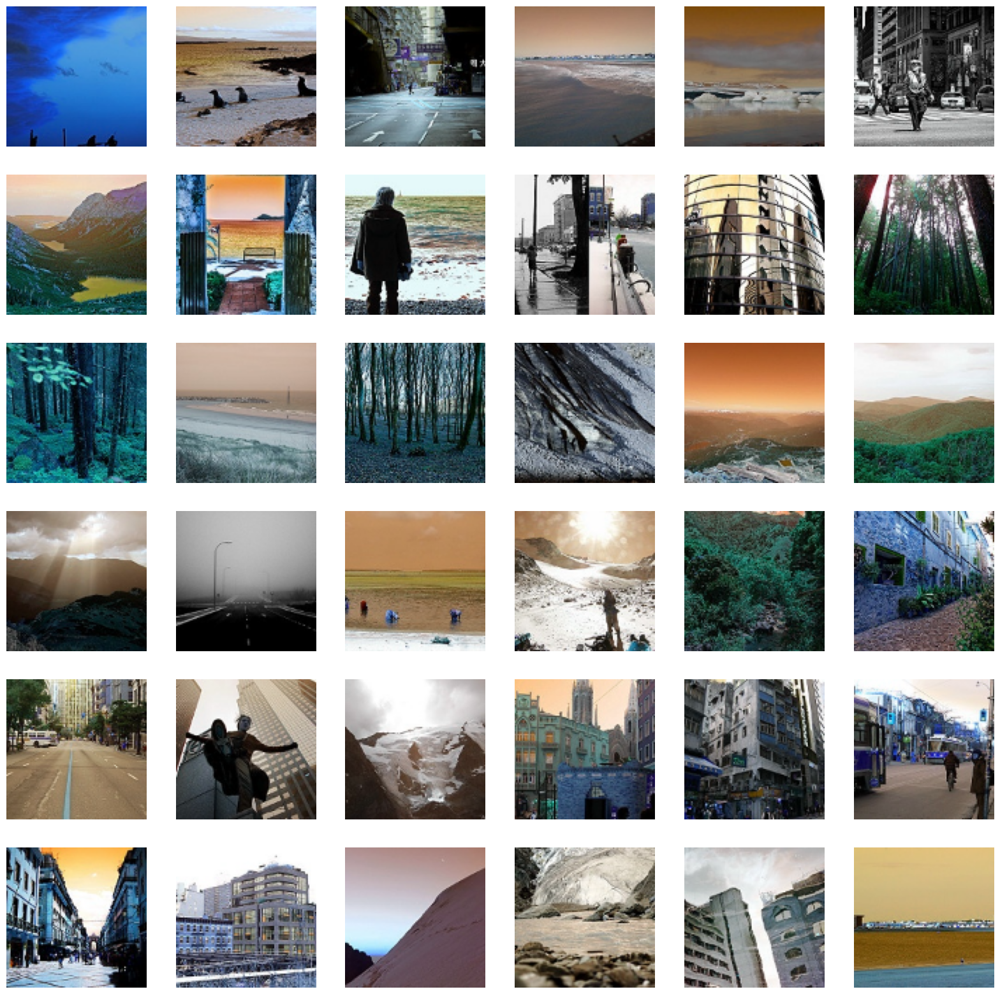

In [20]:
plt.figure(figsize=(20,20))
for n,i in enumerate(list(np.random.randint(0,len(x_pred),36))):
    plt.subplot(6,6,n+1)
    plt.imshow(x_pred[i])
    plt.axis('off')

convert data from lists to arrays

# 7. Converting Data to Arrays

In [21]:
x_train=np.array(x_train)
x_test=np.array(x_test)
x_pred=np.array(x_pred)
y_train=np.array(y_train)
y_test=np.array(y_test)
print(f"x_train shape is {x_train.shape}\n"
      f"x_test shape is {x_test.shape}\n"
      f"x_pred shape is {x_pred.shape}\n"
      f"y_train shape is {y_train.shape}\n"
      f"y_test shape is {y_test.shape}")

x_train shape is (14034, 100, 100, 3)
x_test shape is (3000, 100, 100, 3)
x_pred shape is (7301, 100, 100, 3)
y_train shape is (14034,)
y_test shape is (3000,)


now build cnn model by keras

# 8. Building the CNN Model


In [22]:
KerasModel = keras.models.Sequential([
        keras.layers.Conv2D(2,kernel_size=(3,3),activation='relu',input_shape=(s,s,3)),
        keras.layers.Conv2D(150,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Conv2D(120,kernel_size=(3,3),activation='relu'),    
        keras.layers.Conv2D(80,kernel_size=(3,3),activation='relu'),    
        keras.layers.Conv2D(50,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Flatten() ,    
        keras.layers.Dense(120,activation='relu') ,    
        keras.layers.Dense(100,activation='relu') ,    
        keras.layers.Dense(50,activation='relu') ,        
        keras.layers.Dropout(rate=0.5) ,            
        keras.layers.Dense(6,activation='softmax') ,    
        ])

In [23]:
from tensorflow.keras.callbacks import EarlyStopping
# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=3)


- Compiling the Model

In [24]:
KerasModel.compile(optimizer ='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [25]:
print('Model Details are :')
print(KerasModel.summary())

Model Details are :


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 98, 98, 2)      │            56 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 96, 96, 150)    │         2,850 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 24, 24, 150)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 22, 22, 120)    │       162,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 20, 20, 80)     │        86,480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 18, 18, 50)     │        36,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 4, 4, 50)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 800)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 120)            │        96,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 100)            │        12,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 6)              │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 401,132 (1.53 MB)

 Trainable params: 401,132 (1.53 MB)

 Non-trainable params: 0 (0.00 B)

None


# 9. Training the Model

In [28]:
epochs = 10
ThisModel = KerasModel.fit(x_train, y_train, epochs=epochs,batch_size=64,verbose=1, callbacks=[early_stopping])

Epoch 1/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 318s 1s/step - accuracy: 0.4659 - loss: 1.2668
Epoch 2/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 325s 1s/step - accuracy: 0.5952 - loss: 1.0183
Epoch 3/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 318s 1s/step - accuracy: 0.6410 - loss: 0.9456
Epoch 4/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 321s 1s/step - accuracy: 0.7083 - loss: 0.8030
Epoch 5/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 315s 1s/step - accuracy: 0.7437 - loss: 0.7148
Epoch 6/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 311s 1s/step - accuracy: 0.7586 - loss: 0.6826
Epoch 7/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 313s 1s/step - accuracy: 0.7719 - loss: 0.6530
Epoch 8/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 323s 1s/step - accuracy: 0.7949 - loss: 0.5859
Epoch 9/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 309s 1s/step - accuracy: 0.8154 - loss: 0.5290
Epoch 10/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 333s 2s/step - accuracy: 0.8300 - loss: 0.4848


# 10. Evaluating the Model

In [33]:
model_loss,model_accuracy=KerasModel.evaluate(x_test, y_test)
print('Test Loss is {}'.format(model_loss))
print('Test Accuracy is {}'.format(model_accuracy ))

94/94 ━━━━━━━━━━━━━━━━━━━━ 13s 139ms/step - accuracy: 0.8169 - loss: 0.5301
Test Loss is 0.548253059387207
Test Accuracy is 0.8153333067893982


## Test Accuracy is 0.81

# 11. Making Predictions

- Predictions on Test Data

In [30]:
y_pred = KerasModel.predict(x_test)

print('Prediction Shape is {}'.format(y_pred.shape))

94/94 ━━━━━━━━━━━━━━━━━━━━ 14s 142ms/step
Prediction Shape is (3000, 6)


- Predictions on New Data

In [31]:
y_result = KerasModel.predict(x_pred)

print('Prediction Shape is {}'.format(y_result.shape))

229/229 ━━━━━━━━━━━━━━━━━━━━ 31s 137ms/step
Prediction Shape is (7301, 6)


# 12. Visualizing Predictions

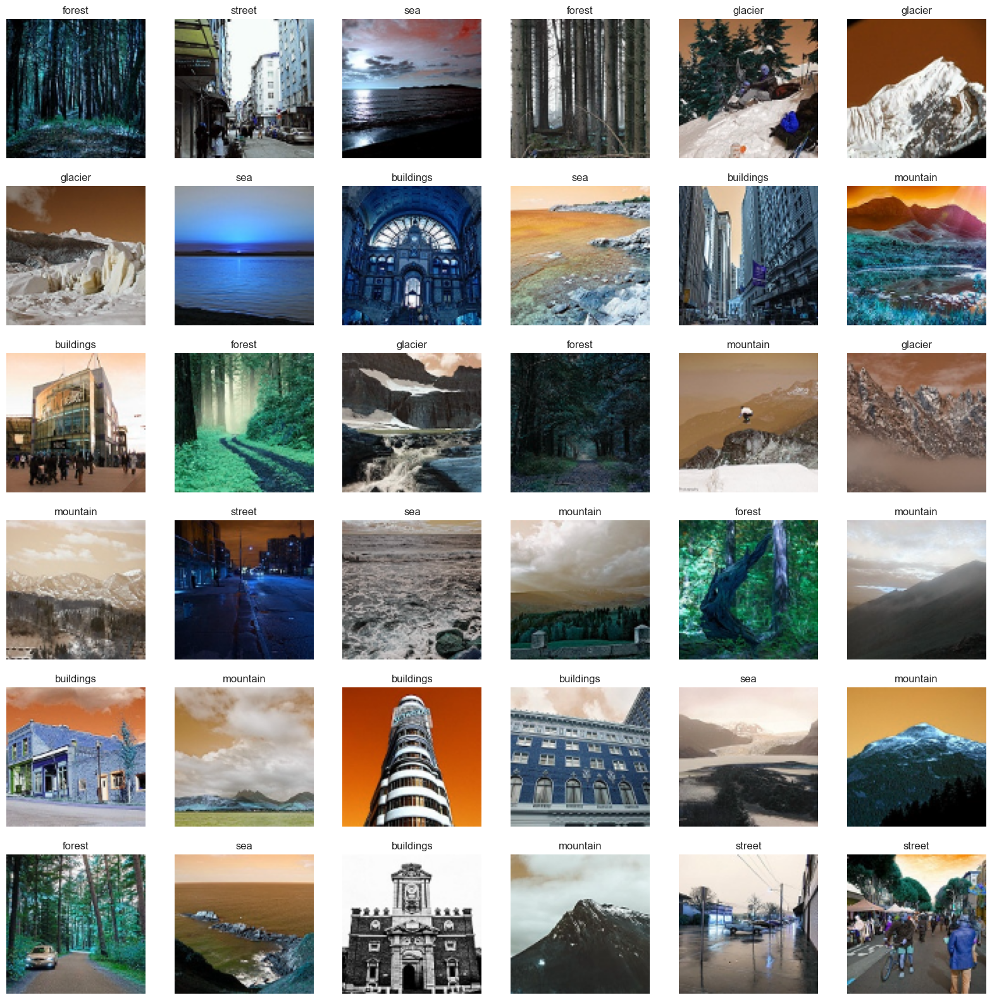

In [32]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(x_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(x_pred[i])    
    plt.axis('off')
    plt.title(getcode(np.argmax(y_result[i])))